<a href="https://colab.research.google.com/github/BaluGDB/AirQualityIndex_Project/blob/main/AirQualityIndexPrediction_DecisionTreeRegressor.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
df = pd.read_csv('/content/drive/My Drive/MLProjects/AQI_Prediction/Data1/Real-Data/Real_Combine.csv')

In [ ]:
df.head()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
0,7.4,9.8,4.8,1017.6,93.0,0.5,4.3,9.4,219.720833
1,7.8,12.7,4.4,1018.5,87.0,0.6,4.4,11.1,182.187500
2,6.7,13.4,2.4,1019.4,82.0,0.6,4.8,11.1,154.037500
3,8.6,15.5,3.3,1018.7,72.0,0.8,8.1,20.6,223.208333
4,12.4,20.9,4.4,1017.3,61.0,1.3,8.7,22.2,200.645833


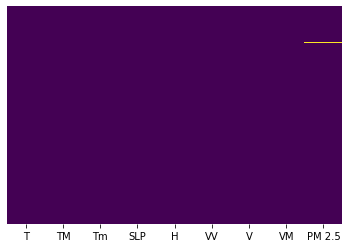

In [ ]:
## Check for null values

sns.heatmap(df.isnull(), yticklabels=False, cbar=False, cmap='viridis')

In [ ]:
df=df.dropna()

In [ ]:
x = df.iloc[:,:-1] ### Independent features
y = df.iloc[:,-1] ### Dependent features

**Decision Tree Regressor**

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


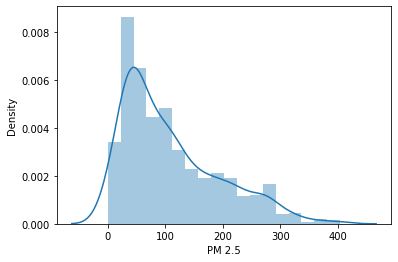

In [ ]:
sns.distplot(y)

**Train Test Split**

In [ ]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.3, random_state=0)

In [ ]:
from sklearn.tree import DecisionTreeRegressor

In [ ]:
dtree = DecisionTreeRegressor(criterion='mse')

In [ ]:
dtree.fit(x_train, y_train)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best')

In [ ]:
print("Coeffficient of determination R^2 ---on train set:  {}".format(dtree.score(x_train, y_train)))

Coeffficient of determination R^2 ---on train set:  1.0


In [ ]:
print("Coeffficient of determination R^2 ---on test set:  {}".format(dtree.score(x_test, y_test)))

Coeffficient of determination R^2 ---on test set:  0.7133632614423989


**Important Interpretations**

In this case, the R^2 is 1.0 for training dataset and R^2 is 0.71.This model is not good. So we can interpret that this model is overfitting as R^2 is 1.0 for training dataset.

**Cross Validation Score**

In [ ]:
from sklearn.model_selection import cross_val_score
cv_score = cross_val_score(dtree, x, y, cv=5)

In [ ]:
cv_score.mean()

0.46768302572927284

Cross Validation score is also very less when compared to previous R^2 score on test dataset

In [ ]:
### Cross Validation score on Training Dataset

from sklearn.model_selection import cross_val_score
cv_score = cross_val_score(dtree, x_train, y_train, cv=5)
cv_score.mean()

0.5910205430146622

In [ ]:
### Cross Validation score on Test Dataset

from sklearn.model_selection import cross_val_score
cv_score = cross_val_score(dtree, x_test, y_test, cv=5)
cv_score.mean()

0.1836464545346596

**Tree Visualization**

In [ ]:
from IPython.display import Image
from sklearn.externals.six import StringIO
from sklearn.tree import export_graphviz
import pydotplus

In [ ]:
features = list(df.columns[:-1])
features

['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM']

import os
os.environ['PATH'] = os.environ['PATH']+';'+os.environ['CONDA_PREFIX']+R"\Library\bin\graphviz"


In [ ]:
dot_data = StringIO()
export_graphviz(dtree, out_file=dot_data, feature_names=features, filled=True, rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.916611 to fit



The decision tree was created completely to its depth, so it is overfitting

In [ ]:
prediction = dtree.predict(x_test)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


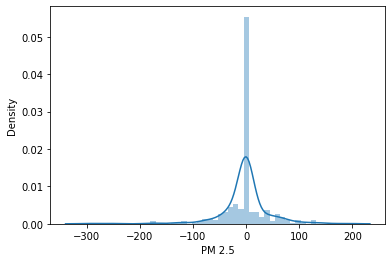

In [ ]:
sns.distplot(y_test - prediction)

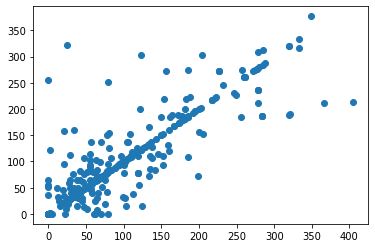

In [ ]:
plt.scatter(y_test, prediction)

**Hyperparameter Tuning - Decision Tree Regressor**

In [ ]:
DecisionTreeRegressor()

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best')

In [ ]:
### Hyperparameters optimization

params = {
    "splitter" :["best", "random"],
    "max_depth"     :   [3,4,5,6,8,10,12,15],
    "min_samples_leaf"  :   [1,2,3,4,5],
    "min_weight_fraction_leaf"  :   [0.1,0.2,0.3,0.4],
    "max_features"  :   ["auto", "log2", "sqrt", None],
    "max_leaf_nodes"    :   [None, 10,20,30,40,50,60]
}

In [ ]:
### Hyperparameter optimization using GridSearchCV

from sklearn.model_selection import GridSearchCV

In [ ]:
grid_search = GridSearchCV(dtree, param_grid=params,scoring='neg_mean_squared_error', n_jobs=-1, cv=10, verbose=3)

In [ ]:
### Timer Function

def timer(start_time=None):
    if not start_time:
        start_time = datetime.now()
        return start_time
    elif start_time:
        thour, temp_sec = divmod((datetime.now() - start_time).total_seconds(), 3600)
        tmin, tsec = divmod(temp_sec, 60)
        print('\n Time taken : %i hours %i minutes and %s seconds.' % (thour,tmin,round(tsec,2)))

In [ ]:
from datetime import datetime

start_time = timer(None) # timing starts from this point for 'start_time' variable
grid_search.fit(x,y)
timer(start_time) #timing ends here for 'start_time' variable

Fitting 10 folds for each of 8960 candidates, totalling 89600 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  58 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 3018 tasks      | elapsed:   10.2s
[Parallel(n_jobs=-1)]: Done 8138 tasks      | elapsed:   23.7s
[Parallel(n_jobs=-1)]: Done 15306 tasks      | elapsed:   44.0s
[Parallel(n_jobs=-1)]: Done 24522 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 35786 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 49098 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 64458 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 81866 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 89600 out of 89600 | elapsed:  4.2min finished



 Time taken : 0 hours 4 minutes and 14.36 seconds.


In [ ]:
grid_search.best_params_

{'max_depth': 8,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'min_samples_leaf': 2,
 'min_weight_fraction_leaf': 0.1,
 'splitter': 'best'}

In [ ]:
grid_search.best_score_

-3131.6489619178874

In [ ]:
prediction = grid_search.predict(x_test)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


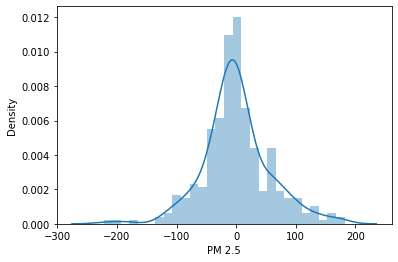

In [ ]:
sns.distplot(y_test - prediction)

In [ ]:
from sklearn import metrics

print ('MAE: ', metrics.mean_absolute_error(y_test, prediction))
print ('MSE: ', metrics.mean_squared_error(y_test, prediction))
print ('RMSE: ', np.sqrt(metrics.mean_squared_error(y_test, prediction)))

MAE:  40.141630924739424
MSE:  3171.808145980198
RMSE:  56.31880810155874


In [ ]:
import pickle

In [ ]:
### Open a file where you want to store the data

file = open('decision_regression_model.pkl', 'wb')

### Dump information to that file
pickle.dump(grid_search, file)

In [ ]:
/content/decision_regression_model.pkl